In [1]:
# Import libraries
from collections import defaultdict
import cv2
from ultralytics import YOLO
from ultralytics.solutions import speed_estimation
from IPython.display import Image

In [2]:
# Defining path variables with the input videos
path_var = "/Users/rambodazimi/Desktop/Montreal/McGill 8/ECSE 415/Assignments/A6"

mcgill_video_path = path_var + "/mcgill_drive.mp4"
catherine_video_path = path_var + "/st-catherines_drive.mp4"

# Tracking both Cars and Pedestrians
### McGill Drive

In [3]:
# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Open the video file
video_path = mcgill_video_path
cap = cv2.VideoCapture(video_path)

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

output_fps = 30 # Frame Rate

fourcc = cv2.VideoWriter_fourcc(*'avc1')  # H.264 codec
output_video = cv2.VideoWriter('mcgill_tracker_output.mp4', fourcc, output_fps, (frame_width, frame_height))

# Store the track history
track_history = defaultdict(lambda: [])

# Counting the total number of cars and pedestrians
TOTAL_CARS_PEDESTRIANS_MCGILL = -1

# Loop over each frame
while cap.isOpened():

    success, frame = cap.read()

    if success:
        results = model.track(frame, persist=True, classes=[0, 2]) # only track cars and pedestrians

        # Get the boxes and track IDs
        boxes = results[0].boxes.xywh.cpu()
        track_ids = results[0].boxes.id.int().cpu().tolist()

        if track_ids:
            TOTAL_CARS_PEDESTRIANS_MCGILL = max(TOTAL_CARS_PEDESTRIANS_MCGILL, max(track_ids)) # find the last ID (count)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Plot the tracks
        for box, track_id in zip(boxes, track_ids):
            x, y, w, h = box
            track = track_history[track_id]
            track.append((float(x), float(y)))
            if len(track) > 30:
                track.pop(0)

        # Write the annotated frame to the output video
        output_video.write(annotated_frame)

        # Display the annotated frame
        cv2.imshow("Car and Pedestrian Tracker (McGill Drive)", annotated_frame)

        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        break

cap.release()
output_video.release()
cv2.destroyAllWindows()


0: 384x640 3 cars, 51.5ms
Speed: 2.8ms preprocess, 51.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 46.0ms
Speed: 1.9ms preprocess, 46.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



2024-04-14 01:53:46.382 Python[58899:56477868] WARNING: Secure coding is not enabled for restorable state! Enable secure coding by implementing NSApplicationDelegate.applicationSupportsSecureRestorableState: and returning YES.


0: 384x640 5 cars, 45.5ms
Speed: 1.7ms preprocess, 45.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 45.4ms
Speed: 1.6ms preprocess, 45.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 42.8ms
Speed: 1.6ms preprocess, 42.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 41.7ms
Speed: 1.5ms preprocess, 41.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 41.9ms
Speed: 1.4ms preprocess, 41.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 42.1ms
Speed: 1.3ms preprocess, 42.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 40.9ms
Speed: 1.5ms preprocess, 40.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 43.0ms
Speed: 1.3ms preprocess, 43.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x6

### Saint Catherines

In [4]:
# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

# Open the video file
video_path = catherine_video_path
cap = cv2.VideoCapture(video_path)

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

output_fps = 30 # Frame Rate

fourcc = cv2.VideoWriter_fourcc(*'avc1')  # H.264 codec
output_video = cv2.VideoWriter('catherine_tracker_output.mp4', fourcc, output_fps, (frame_width, frame_height))

# Store the track history
track_history = defaultdict(lambda: [])

# Counting the total number of cars and pedestrians
TOTAL_CARS_PEDESTRIANS_CATHERINE = -1

# Loop over each frame
while cap.isOpened():

    success, frame = cap.read()

    if success:
        results = model.track(frame, persist=True, classes=[0, 2]) # only track cars and pedestrians

        # Get the boxes and track IDs
        boxes = results[0].boxes.xywh.cpu()
        track_ids = results[0].boxes.id.int().cpu().tolist()

        if track_ids:
            TOTAL_CARS_PEDESTRIANS_CATHERINE = max(TOTAL_CARS_PEDESTRIANS_CATHERINE, max(track_ids)) # find the last ID (count)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Plot the tracks
        for box, track_id in zip(boxes, track_ids):
            x, y, w, h = box
            track = track_history[track_id]
            track.append((float(x), float(y)))
            if len(track) > 30:
                track.pop(0)

        # Write the annotated frame to the output video
        output_video.write(annotated_frame)

        # Display the annotated frame
        cv2.imshow("Car and Pedestrian Tracker (St. Catherines Drive)", annotated_frame)

        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        break

cap.release()
output_video.release()
cv2.destroyAllWindows()


0: 384x640 3 cars, 43.5ms
Speed: 1.9ms preprocess, 43.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 46.7ms
Speed: 2.0ms preprocess, 46.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 42.7ms
Speed: 1.7ms preprocess, 42.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 42.8ms
Speed: 1.6ms preprocess, 42.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 39.5ms
Speed: 1.5ms preprocess, 39.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 42.0ms
Speed: 1.6ms preprocess, 42.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 41.8ms
Speed: 1.6ms preprocess, 41.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 43.5ms
Speed: 1.4ms preprocess, 43.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x

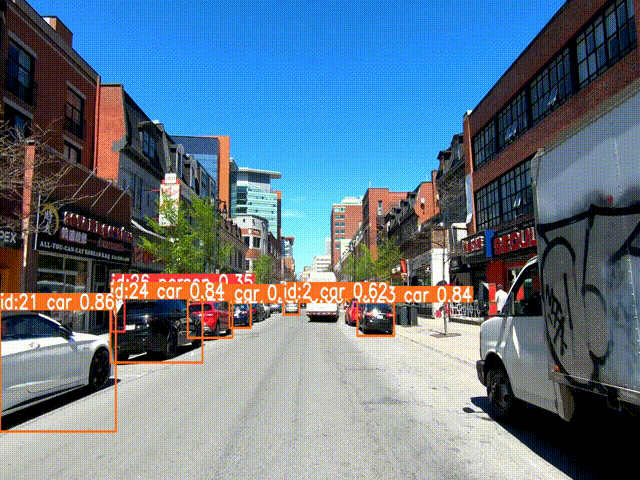

In [5]:
Image(filename = path_var + "/tracking.gif")

# Track Cars
### McGill Drive

In [6]:
# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

video_path = mcgill_video_path
cap = cv2.VideoCapture(video_path)

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Store the track history
track_history = defaultdict(lambda: [])

TOTAL_CARS_MCGILL = -1

while cap.isOpened():
    success, frame = cap.read()

    if success:
        results = model.track(frame, persist=True, classes=[2]) # only track cars

        # Get the boxes and track IDs
        boxes = results[0].boxes.xywh.cpu()
        track_ids = results[0].boxes.id.int().cpu().tolist()

        if track_ids:
            TOTAL_CARS_MCGILL = max(TOTAL_CARS_MCGILL, max(track_ids))

        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()


0: 384x640 3 cars, 50.0ms
Speed: 1.7ms preprocess, 50.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 43.6ms
Speed: 2.1ms preprocess, 43.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 41.1ms
Speed: 2.1ms preprocess, 41.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 40.6ms
Speed: 2.0ms preprocess, 40.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 41.2ms
Speed: 1.5ms preprocess, 41.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 39.2ms
Speed: 1.7ms preprocess, 39.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 40.8ms
Speed: 2.0ms preprocess, 40.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 40.7ms
Speed: 1.6ms preprocess, 40.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x

### St. Catherines

In [7]:
# Load the YOLOv8 model
model = YOLO('yolov8n.pt')

video_path = catherine_video_path
cap = cv2.VideoCapture(video_path)

frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Store the track history
track_history = defaultdict(lambda: [])

TOTAL_CARS_CATHERINE = -1

while cap.isOpened():
    success, frame = cap.read()

    if success:
        results = model.track(frame, persist=True, classes=[2]) # only track cars

        # Get the boxes and track IDs
        boxes = results[0].boxes.xywh.cpu()
        track_ids = results[0].boxes.id.int().cpu().tolist()

        if track_ids:
            TOTAL_CARS_CATHERINE = max(TOTAL_CARS_CATHERINE, max(track_ids))

        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        break

cap.release()
cv2.destroyAllWindows()


0: 384x640 3 cars, 45.5ms
Speed: 2.1ms preprocess, 45.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 41.1ms
Speed: 2.0ms preprocess, 41.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 39.5ms
Speed: 2.1ms preprocess, 39.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 39.5ms
Speed: 1.5ms preprocess, 39.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 40.4ms
Speed: 1.6ms preprocess, 40.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 40.7ms
Speed: 1.4ms preprocess, 40.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 42.4ms
Speed: 1.4ms preprocess, 42.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 39.6ms
Speed: 1.5ms preprocess, 39.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x

# Speed Estimation
### McGill Drive

In [8]:
model = YOLO("yolov8n.pt")
names = model.model.names

cap = cv2.VideoCapture(mcgill_video_path)
assert cap.isOpened(), "Error reading video file"
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))

# Video writer
video_writer = cv2.VideoWriter('mcgill_speed_output.mp4', fourcc, output_fps, (frame_width, frame_height))

# Position of the line to calculate the speed based on that
line_pts = [(0, 1050), (2562, 1050)]

# Initialize speed-estimation obj
speed_obj = speed_estimation.SpeedEstimator()
speed_obj.set_args(reg_pts=line_pts, names=names, view_img=True)

# Keep track of all ids that are parked
parked_cars_track_ids_mcgill = []

while cap.isOpened():
    success, im0 = cap.read()
    if not success:
        print("Video frame is empty or video processing has been successfully completed.")
        break

    tracks = model.track(im0, persist=True, show=False, classes=[2]) # track only cars

    im0, parked_cars_track_ids_mcgill = speed_obj.estimate_speed(im0, tracks, video="mcgill")

    video_writer.write(im0)

cap.release()
video_writer.release()
cv2.destroyAllWindows()


0: 384x640 3 cars, 47.2ms
Speed: 2.2ms preprocess, 47.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 40.1ms
Speed: 2.0ms preprocess, 40.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 41.0ms
Speed: 1.8ms preprocess, 41.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 40.7ms
Speed: 1.8ms preprocess, 40.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 41.5ms
Speed: 1.6ms preprocess, 41.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 57.5ms
Speed: 1.7ms preprocess, 57.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 40.2ms
Speed: 1.6ms preprocess, 40.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 38.8ms
Speed: 1.6ms preprocess, 38.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Parked c

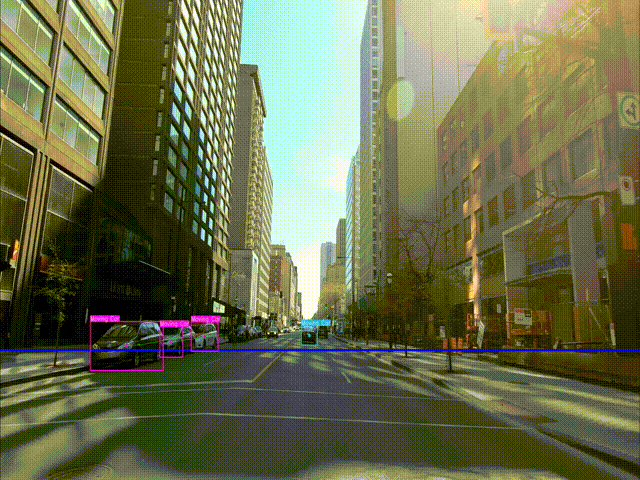

In [9]:
Image(filename = path_var + "/speed.gif")

### St. Catherines

In [10]:
model = YOLO("yolov8n.pt")
names = model.model.names

cap = cv2.VideoCapture(catherine_video_path)
assert cap.isOpened(), "Error reading video file"
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))

# Video writer
video_writer = cv2.VideoWriter('catherine_speed_output.mp4', fourcc, output_fps, (frame_width, frame_height))

# Position of the line to calculate the speed based on that
line_pts = [(0, 1050), (2562, 1050)]

# Initialize speed-estimation obj
speed_obj = speed_estimation.SpeedEstimator()
speed_obj.set_args(reg_pts=line_pts, names=names, view_img=True)

# Keep track of all ids that are parked
parked_cars_track_ids_catherine = []

while cap.isOpened():
    success, im0 = cap.read()
    if not success:
        print("Video frame is empty or video processing has been successfully completed.")
        break

    tracks = model.track(im0, persist=True, show=False, classes=[2]) # track only cars

    im0, parked_cars_track_ids_catherine = speed_obj.estimate_speed(im0, tracks, video="catherine")

    video_writer.write(im0)

cap.release()
video_writer.release()
cv2.destroyAllWindows()


0: 384x640 3 cars, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 37.9ms
Speed: 2.3ms preprocess, 37.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 42.2ms
Speed: 1.9ms preprocess, 42.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 40.6ms
Speed: 1.8ms preprocess, 40.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 40.2ms
Speed: 1.8ms preprocess, 40.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 40.6ms
Speed: 1.7ms preprocess, 40.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cars, 40.1ms
Speed: 1.5ms preprocess, 40.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cars, 39.7ms
Speed: 1.6ms preprocess, 39.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x

In [11]:
# McGill Drive Results
print("Results of Running McGill Drive")
print("----------------------------------------------")
print(f"TOTAL NUMBER OF CARS DETECTED: {TOTAL_CARS_MCGILL}")
print(f"TOTAL NUMBER OF PEDESTRIANS DETECTED: {TOTAL_CARS_PEDESTRIANS_MCGILL - TOTAL_CARS_MCGILL}")
print("----------------------------------------------")
parked_cars_mcgill = list(set(parked_cars_track_ids_mcgill))
print(f"PARKED CARS DETECTED: {len(parked_cars_mcgill)}")
print(f"MOVING CARS DETECTED: {TOTAL_CARS_MCGILL - len(parked_cars_mcgill)}")
print("----------------------------------------------")
print("----------------------------------------------")

# St. Catherines Results
print("Results of Running St. Catherines Drive")
print("----------------------------------------------")
print(f"TOTAL NUMBER OF CARS DETECTED: {TOTAL_CARS_CATHERINE}")
print(f"TOTAL NUMBER OF PEDESTRIANS DETECTED: {TOTAL_CARS_PEDESTRIANS_CATHERINE - TOTAL_CARS_CATHERINE}")
print("----------------------------------------------")
parked_cars_catherine = list(set(parked_cars_track_ids_catherine))
print(f"PARKED CARS DETECTED: {len(parked_cars_catherine)}")
print(f"MOVING CARS DETECTED: {TOTAL_CARS_CATHERINE - len(parked_cars_catherine)}")

Results of Running McGill Drive
----------------------------------------------
TOTAL NUMBER OF CARS DETECTED: 62
TOTAL NUMBER OF PEDESTRIANS DETECTED: 43
----------------------------------------------
PARKED CARS DETECTED: 58
MOVING CARS DETECTED: 4
----------------------------------------------
----------------------------------------------
Results of Running St. Catherines Drive
----------------------------------------------
TOTAL NUMBER OF CARS DETECTED: 82
TOTAL NUMBER OF PEDESTRIANS DETECTED: 104
----------------------------------------------
PARKED CARS DETECTED: 58
MOVING CARS DETECTED: 24
